In [1]:
import numpy as np
import matplotlib.pyplot as plt

In [2]:
deg2rad = np.pi / 180.0
rad2deg = 180.0 / np.pi

In [3]:
alpha = 0.001
dphi = 2*deg2rad
dtheta1_d = 2*3
dtheta2_d = 2
dtheta3_d = 2
dt = 1e-3
tot_time = 15.0
N_steps = int(tot_time / dt)
N_phi = int(2*np.pi/ dphi)

In [4]:
stab_par1 = alpha * dt * ((1/(dtheta1_d*deg2rad)**2)+(1/(dphi)**2)) + ((6*deg2rad)/dtheta1_d*deg2rad)*dt + ((5*deg2rad)/(0.0697*dphi))*dt
stab_par2 = alpha * dt * ((1/(dtheta2_d*deg2rad)**2)+(1/(dphi)**2)) + ((6*deg2rad)/dtheta1_d*deg2rad)*dt + ((5*deg2rad)/(0.7071*dphi))*dt
stab_par3 = alpha * dt * ((1/(dtheta3_d*deg2rad)**2)+(1/(dphi)**2)) + ((6*deg2rad)/dtheta1_d*deg2rad)*dt + ((5*deg2rad)/(1*dphi))*dt
print("Stability parameters:")
print(f"stab_par1: {stab_par1}")
print(f"stab_par2: {stab_par2}")
print(f"stab_par3: {stab_par3}")
assert stab_par1 <= 0.5, "Diffusion stability condition violated"
assert stab_par2 <= 0.5, "Diffusion stability condition violated"
assert stab_par3 <= 0.5, "Diffusion stability condition violated"

Stability parameters:
stab_par1: 0.03678020100908174
stab_par2: 0.0051772756046162965
stab_par3: 0.004141707792425659


In [5]:
theta_1n = np.arange(1e-3, 30, dtheta1_d)
theta_2n = np.arange(30, 60, dtheta2_d)
theta_3 = np.arange(60, 120, dtheta3_d)
theta_2s = np.arange(120, 150, dtheta2_d)
theta_1s = np.arange(150, 180 - 1e-3, dtheta1_d)
print("theta_1n:", theta_1n.shape)
print("theta_2n:", theta_2n.shape)  
print("theta_3:", theta_3.shape)
print("theta_2s:", theta_2s.shape)
print("theta_1s:", theta_1s.shape)
N_theta = (len(theta_1n) + len(theta_2n) + len(theta_3) + len(theta_2s) + len(theta_1s))

theta_1n: (5,)
theta_2n: (15,)
theta_3: (30,)
theta_2s: (15,)
theta_1s: (5,)


In [6]:
theta_deg = np.concatenate((theta_1n, theta_2n, theta_3, theta_2s, theta_1s))
theta = theta_deg * deg2rad
dtheta1 = dtheta1_d * deg2rad
dtheta2 = dtheta2_d * deg2rad
dtheta3 = dtheta3_d * deg2rad

In [7]:
phi = np.arange(0, 2 * np.pi, dphi)
Phi, Theta = np.meshgrid(phi, theta)

In [8]:
Phi_deg = Phi * rad2deg
Theta_deg = Theta * rad2deg

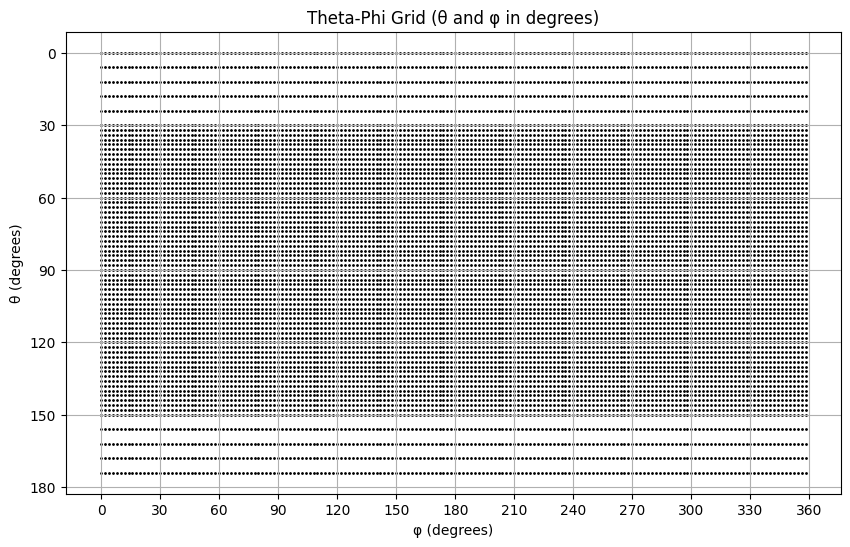

In [9]:
plt.figure(figsize=(10, 6))
plt.scatter(Phi_deg, Theta_deg, s=1, color='black')
plt.xlabel("φ (degrees)")
plt.ylabel("θ (degrees)")
plt.gca().invert_yaxis()
plt.title("Theta-Phi Grid (θ and φ in degrees)")
plt.xticks(np.arange(0, 361, 30))
plt.yticks(np.arange(0, 181, 30))
plt.grid(True)
plt.show()

In [10]:
sigma_t = 5 * deg2rad
sigma_p = 7.07 * deg2rad 
T_plus_1 = 3*np.exp(-0.5*(((Theta - (9*np.pi/24) )/sigma_t)**2+((Phi - np.pi*(6/6))/sigma_p)**2))
T_minus_1 = -3*np.exp(-0.5*(((Theta - (10.5*np.pi/24) )/sigma_t)**2+((Phi - np.pi*(7/6))/sigma_p)**2))
T_plus_2 = 3*np.exp(-0.5*(((Theta - (13.5*np.pi/24) )/sigma_t)**2+((Phi - np.pi*(7/6))/sigma_p)**2))
T_minus_2 = -3*np.exp(-0.5*(((Theta - (15*np.pi/24) )/sigma_t)**2+((Phi - np.pi*(6/6))/sigma_p)**2))
T = T_plus_1 + T_minus_1 + T_plus_2 + T_minus_2

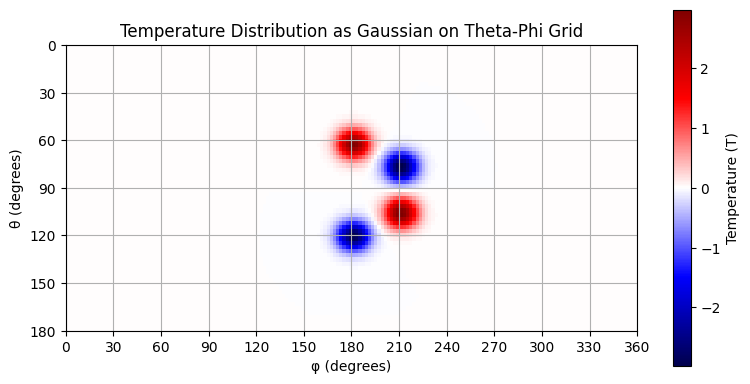

In [11]:
plt.figure(figsize=(8, 4))
plt.imshow(T, extent=(0, 360, 0, 180), aspect='equal', origin='lower', cmap='seismic')
plt.colorbar(label='Temperature (T)')
plt.xlabel("φ (degrees)")
plt.ylabel("θ (degrees)")
plt.gca().invert_yaxis()
plt.title("Temperature Distribution as Gaussian on Theta-Phi Grid")
plt.xticks(np.arange(0, 361, 30))
plt.yticks(np.arange(0, 181, 30))
plt.grid(True)
plt.tight_layout()
plt.show()

In [12]:
N_phi, N_theta

(180, 70)

In [13]:
Phi.shape

(70, 180)

In [14]:
dtheta_rad = np.zeros(N_theta)
dtheta_rad[:len(theta_1n)] = dtheta1
dtheta_rad[len(theta_1n):len(theta_1n) + len(theta_2n)] = dtheta2
dtheta_rad[len(theta_1n) + len(theta_2n):len(theta_1n) + len(theta_2n) + len(theta_3)] = dtheta3
dtheta_rad[len(theta_1n) + len(theta_2n) + len(theta_3):len(theta_1n) + len(theta_2n) + len(theta_3) + len(theta_2s)] = dtheta2
dtheta_rad[len(theta_1n) + len(theta_2n) + len(theta_3) + len(theta_2s):] = dtheta1

In [15]:
dtheta_rad

array([0.10471976, 0.10471976, 0.10471976, 0.10471976, 0.10471976,
       0.03490659, 0.03490659, 0.03490659, 0.03490659, 0.03490659,
       0.03490659, 0.03490659, 0.03490659, 0.03490659, 0.03490659,
       0.03490659, 0.03490659, 0.03490659, 0.03490659, 0.03490659,
       0.03490659, 0.03490659, 0.03490659, 0.03490659, 0.03490659,
       0.03490659, 0.03490659, 0.03490659, 0.03490659, 0.03490659,
       0.03490659, 0.03490659, 0.03490659, 0.03490659, 0.03490659,
       0.03490659, 0.03490659, 0.03490659, 0.03490659, 0.03490659,
       0.03490659, 0.03490659, 0.03490659, 0.03490659, 0.03490659,
       0.03490659, 0.03490659, 0.03490659, 0.03490659, 0.03490659,
       0.03490659, 0.03490659, 0.03490659, 0.03490659, 0.03490659,
       0.03490659, 0.03490659, 0.03490659, 0.03490659, 0.03490659,
       0.03490659, 0.03490659, 0.03490659, 0.03490659, 0.03490659,
       0.10471976, 0.10471976, 0.10471976, 0.10471976, 0.10471976])

In [16]:
print(T.shape)
T = T.T
print(T.shape)

(70, 180)
(180, 70)


In [17]:
cot = 1/np.tan(theta)
sin2 = 1/(np.sin(theta))**2
senin = 1/(np.sin(theta))

In [18]:
all_values = np.zeros((N_steps+1, N_phi, N_theta))
all_values[0, :, :] = T

In [19]:
T_new = np.zeros_like(T)
T_new.shape

(180, 70)

In [20]:
cos = np.cos(theta)
v_mag = (6*np.sin(theta)) * deg2rad
v_phi = (10 - (2.3 * (cos**2)) - (1.62 * (cos**4)))* deg2rad 
v_theta = v_mag * np.sign(theta - np.pi/2)

<function matplotlib.pyplot.show(close=None, block=None)>

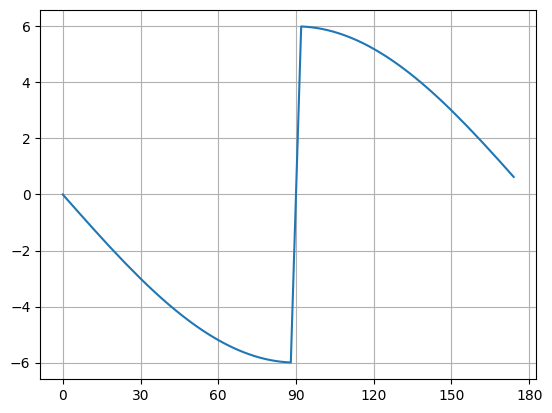

In [21]:
plt.plot(theta_deg, v_theta * rad2deg, label='v_theta')
plt.grid()
plt.xticks(np.arange(0, 181, 30))
plt.show

In [22]:
accum_bottom = np.zeros(N_phi)
accum_top = np.zeros(N_phi)

In [23]:
for n in range(1,N_steps+1):
    for i in range(1,N_phi-1):
        for j in range(1,N_theta):
            if j==1 or j==N_theta-1:
                diffusion = 0
            else:
                diffusion = alpha * dt * (((T[i, j+1] - 2*T[i, j] + T[i, j-1])/dtheta_rad[j]**2) + 
                                                cot[j] * ((T[i,j]-T[i,j-1])/dtheta_rad[j])
                                                + (1/sin2[j]) * ((T[i+1, j] - 2*T[i, j] + T[i-1, j])/dphi**2))
            vth = v_theta[j]
            if vth == 0:
                advection_theta = 0
            elif vth > 0:
                advection_theta = dt * (-vth * (T[i,j] - T[i,j-1]) / dtheta_rad[j])
            elif vth < 0:
                advection_theta = dt * (-vth * (T[i,j+1] - T[i,j]) / dtheta_rad[j])

            advection_phi = dt * senin[j] * (v_phi[j] * (T[i+1, j] - T[i-1, j]) /dphi)
            
            T_new[i,j] = T[i,j] + diffusion + advection_theta - advection_phi
    T_new[0, 1:-1] = T_new[-2, 1:-1] 
    T_new[-1, 1:-1] = T_new[1, 1:-1]

    accum_bottom += T_new[:, 1]
    accum_top += T_new[:, -2]

    T_new[1:-1, 0] = T_new[1:-1, 1]
    T_new[1:-1, -1] = T_new[1:-1, -2]
    T = T_new.copy()
    all_values[n, :, :] = T
    all_values[n, :, 0] = accum_bottom
    all_values[n, :, -1] = accum_top

In [24]:
all_values = np.transpose(all_values, (0, 2, 1))

In [25]:
from matplotlib.animation import FuncAnimation
fig, ax = plt.subplots()
#vmin = np.min(all_values)
#vmax = np.max(all_values)
cax = ax.imshow(all_values[0], extent=[0, 360, 0, 180], aspect='equal', origin='lower', cmap='seismic', vmin=-5, vmax=5)
fig.colorbar(cax, label='Temperature')
ax.set_title('2D Heat Diffusion')
ax.set_ylabel('θ (degrees)')
ax.set_xlabel('φ (degrees)')
ax.set_xticks(np.arange(0, 361, 30))
ax.set_yticks(np.arange(0, 181, 15))
ax.grid(True)
ax.invert_yaxis()

def animate(frame):
    data = all_values[frame]
    ax.set_title(f'2D Heat Diffusion at t = {frame*dt:.2f} s')
    cax.set_data(data)
    return [cax]

interval_steps = 100
ani = FuncAnimation(fig, animate, frames=range(0, N_steps+1, interval_steps), interval=100, blit=True, repeat=False)

plt.close(fig)
from IPython.display import HTML
HTML(ani.to_jshtml())

In [26]:
from matplotlib.animation import PillowWriter
writer = PillowWriter(fps=10)
ani.save('theta_phi_diffusion.gif', writer=writer)